In [1]:
%load_ext autoreload
%autoreload 2

### data loading and preparation

In [2]:
import concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')
import time
from pathlib import Path
device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
seed = 0

/home/ec2-user/miniforge3/envs/concord/lib/python3.12/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [3]:
adata = sc.read_h5ad(Path('../data/CBCEcombineN2/') / 'adata_celsub_Jun26-1610.h5ad')

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '../data/CBCEcombineN2/adata_celsub_Jun26-1610.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [3]:
proj_name = "cel_packerN2_hyperparam"
file_name = "cel_packerN2_hyperparam"
file_suffix = time.strftime('%b%d-%H%M')
seed = 0

save_dir = Path(f"../save/{proj_name}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)


In [5]:
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=10000, subset=False)
sc.tl.pca(adata, n_comps=300, svd_solver='arpack', use_highly_variable=True)
adata = adata[:, adata.var.highly_variable].copy()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [6]:
adata.write_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")
print(f"✅ Preprocessed data saved to {data_dir / f'{file_name}_preprocessed.h5ad'}")

✅ Preprocessed data saved to ../data/cel_packerN2_hyperparam/cel_packerN2_hyperparam_preprocessed.h5ad


In [19]:
DATA_FILE     = Path(f"{file_name}_preprocessed.h5ad")
adata = sc.read_h5ad(data_dir / DATA_FILE)

### Create jobs

In [6]:
import json, math, subprocess, scanpy as sc
from pathlib import Path

# ------------------------------------------------------------
# 1. global sweep settings
# ------------------------------------------------------------
TOTAL_STEPS   = 20000          # keep *updates* per run constant
BASE_LR       = 1e-2            # lr used at BASE_BATCH
BASE_BATCH    = 64              # reference batch for LR scaling


N_CELLS = adata.n_obs
print(f"✔ Dataset has {N_CELLS:,} cells")


✔ Dataset has 94,276 cells


In [17]:
# HCL mode jobs
# ------------------------------------------------------------
# 2. base & grid
# ------------------------------------------------------------
concord_base_args = {
    "latent_dim": 300,
    "batch_size": BASE_BATCH,
    "encoder_dims": [1000],
    "p_intra_domain": 1.0,
    "p_intra_knn": 0.0,
    "clr_beta": 1.0,
    "augmentation_mask_prob": 0.30,
    "clr_temperature": 0.30,
    "sampler_knn": 1000,
    "n_epochs": 15,        # gets overwritten below
    "lr":       BASE_LR,   # gets overwritten below
    "save_dir": "../" + str(save_dir),
}

param_grid = {
    "batch_size":  [16, 32, 64, 128, 256, 512, 1024, 2048],     # sweep 2 values
    "latent_dim":  [10, 50, 100, 500, 1000],    # sweep 2 values
    "p_intra_domain": [0.6, 0.7, 0.8, 0.9, 0.95],  # sweep 6 values
    "clr_beta" : [0.0, 0.5, 1.0, 2.0, 6.0],  # sweep 5 values
    "augmentation_mask_prob": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 5 values
    "clr_temperature": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 
    "n_epochs": [5, 10, 15, 20, 30]
}

# ------------------------------------------------------------
# 3. expand jobs (one-at-a-time)
# ------------------------------------------------------------
jobs = ccd.bm.expand_one_at_a_time(
    concord_base_args,
    param_grid,
    base_tag="concord_hcl",
)

# ------------------------------------------------------------
# 4. adjust epochs + lr for each job
# ------------------------------------------------------------
output_dir = "../jobs"
verbose    = False          # add --verbose when needed

for kw in jobs:
    B = kw["batch_size"]

    # a) compute epochs so updates == TOTAL_STEPS
    steps_per_epoch = math.ceil(N_CELLS / B)
    kw["n_epochs"]  = math.ceil(TOTAL_STEPS / steps_per_epoch)

    # b) scale learning-rate linearly with batch size
    kw["lr"] = BASE_LR * B / BASE_BATCH

    # --------------------------------------------------------
    # 5. hand off to script generator
    # --------------------------------------------------------
    cmd = [
        "python", "./generate_py_jobs.py",
        "--proj_name",      proj_name,
        "--adata_filename", DATA_FILE.name,
        "--methods",        "concord_hcl",
        "--batch_key",      "batch",
        "--state_key",      "None",
        "--latent_dim",     str(kw["latent_dim"]),
        "--output_dir",     output_dir,
        "--device",         "auto",
        "--conda_env",      "cellpath",
        "--runtime",        "02:00:00",
        "--concord_kwargs", json.dumps(kw),
    ]
    if verbose:
        cmd.append("--verbose")

    subprocess.run(cmd, check=True)

print(f"✔ Generated {len(jobs)} jobs for concord_hcl mode in {output_dir}")

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-16.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-16.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-32.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-32.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-64.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-64.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-128.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_hcl_concord_hcl_batch_size-128.sh

✅ Generated: bench

In [18]:
# KNN mode jobs
# ------------------------------------------------------------
# 2. base & grid
# ------------------------------------------------------------
concord_base_args = {
    "latent_dim": 300,
    "batch_size": BASE_BATCH,
    "encoder_dims": [1000],
    "p_intra_domain": 1.0,
    "p_intra_knn": 0.3,
    "clr_beta": 0.0,
    "augmentation_mask_prob": 0.30,
    "clr_temperature": 0.30,
    "sampler_knn": 1000,
    "n_epochs": 15,        # gets overwritten below
    "lr":       BASE_LR,   # gets overwritten below
    "save_dir": "../" + str(save_dir),
}

param_grid = {
    "batch_size":  [16, 32, 64, 128, 256, 512, 1024, 2048],     # sweep 2 values
    "latent_dim":  [10, 50, 100, 500, 1000],    # sweep 2 values
    "p_intra_domain": [0.6, 0.7, 0.8, 0.9, 0.95],  # sweep 6 values
    "p_intra_knn" : [0.0, 0.1, 0.2, 0.3, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  
    "sampler_knn": [100, 300, 1000, 3000, 10000],  # sweep 5 values
    "augmentation_mask_prob": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8], 
    "clr_temperature": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 
    "n_epochs": [5, 10, 15, 20, 30]
}

# ------------------------------------------------------------
# 3. expand jobs (one-at-a-time)
# ------------------------------------------------------------
jobs = ccd.bm.expand_one_at_a_time(
    concord_base_args,
    param_grid,
    base_tag="concord_knn",
)

# ------------------------------------------------------------
# 4. adjust epochs + lr for each job
# ------------------------------------------------------------
output_dir = "../jobs"
verbose    = False          # add --verbose when needed

for kw in jobs:
    B = kw["batch_size"]

    # a) compute epochs so updates == TOTAL_STEPS
    steps_per_epoch = math.ceil(N_CELLS / B)
    kw["n_epochs"]  = math.ceil(TOTAL_STEPS / steps_per_epoch)

    # b) scale learning-rate linearly with batch size
    kw["lr"] = BASE_LR * B / BASE_BATCH

    # --------------------------------------------------------
    # 5. hand off to script generator
    # --------------------------------------------------------
    cmd = [
        "python", "./generate_py_jobs.py",
        "--proj_name",      proj_name,
        "--adata_filename", DATA_FILE.name,
        "--methods",        "concord_knn",
        "--batch_key",      "batch",
        "--state_key",      "None",
        "--latent_dim",     str(kw["latent_dim"]),
        "--output_dir",     output_dir,
        "--device",         "auto",
        "--conda_env",      "cellpath",
        "--runtime",        "02:00:00",
        "--concord_kwargs", json.dumps(kw),
    ]
    if verbose:
        cmd.append("--verbose")

    subprocess.run(cmd, check=True)

print(f"✔ Generated {len(jobs)} jobs for concord_knn mode in {output_dir}")

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-16.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-16.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-32.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-32.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-64.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-64.sh

✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-128.py
✅ Generated: benchmark_cel_packerN2_hyperparam/benchmark_cel_packerN2_hyperparam_concord_knn_concord_knn_batch_size-128.sh

✅ Generated: bench

In [9]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"   # ../jobs/benchmark_<proj>
proj_folder.mkdir(exist_ok=True)                      # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"
with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — submits every job for this project\n")
    f.write("# Run from this folder, or let the script cd into it.\n\n")
    f.write('cd "$(dirname "$0")"\n\n')          # ensures we’re in the right dir
    for sh_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.sh")):
        f.write(f'qsub "{sh_file.name}"\n')

submit_all.chmod(0o755)
print(f"📌  Run “{submit_all}” to queue every job.")

📌  Run “../jobs/benchmark_cel_packerN2_hyperparam/submit_all_cel_packerN2_hyperparam.sh” to queue every job.


In [13]:
# ------------------------------------------------------------------
# create submit_sequential_<proj>.sh  (runs each *.py job in order)
# ------------------------------------------------------------------
sequential_submit = proj_folder / f"submit_sequential_{proj_name}.sh"

sequential_template = """#!/bin/bash
set -euo pipefail
cd "$(dirname "$0")"           # work inside this folder
shopt -s nullglob              # empty globs expand to nothing

for job in *.py; do
  base=${job%.py}              # strip the .py suffix
  log="${base}.log"            # e.g. train_model.py → train_model.log

  echo ">>> $job   $(date)" | tee -a "$log"
  if python "$job" >>"$log" 2>&1; then
      echo ">>> finished OK"   | tee -a "$log"
  else
      echo ">>> FAILED"        | tee -a "$log"
  fi
done
"""

sequential_submit.write_text(sequential_template)
sequential_submit.chmod(0o755)
print(f"📌  Run “{sequential_submit}” to queue jobs sequentially.")


📌  Run “../jobs/benchmark_cel_packerN2_hyperparam/submit_sequential_cel_packerN2_hyperparam.sh” to queue jobs sequentially.


### Collect results

In [16]:
# Delete existing latents in adata.obsm
for key in list(adata.obsm.keys()):
    del adata.obsm[key]

In [17]:
# Get output_key from the jobs dictionary
output_keys = [f"{job['output_key']}" for job in jobs]
output_keys

['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']

In [18]:
#methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive", "seurat_cca", "seurat_rpca"]
from benchmark_utils import add_embeddings
# ---------------------------- Add Embeddings ----------------------------
#adata = sc.read_h5ad(Path('../data/CBCEcombineN2/') / 'adata_celsub_Jun26-1610.h5ad') # Load the log normalized but unfiltered adata
adata = add_embeddings(adata, proj_name=proj_name, methods=output_keys)

✅ obsm['concord_hcl_latent_dim-300'] loaded
✅ obsm['concord_hcl_latent_dim-1000'] loaded


In [19]:
for method in output_keys:
    if f"{method}_UMAP" in adata.obsm:
        print(f"[⚠️ Warning] obsm['{method}_UMAP'] already exists, skipping UMAP computation")
    else:
        print(f"Computing 2D UMAP for {method}...")
        ccd.ul.run_umap(adata, source_key=f"{method}", result_key=f"{method}_UMAP", n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
        print(f"✅ obsm['{method}_UMAP'] computed")
    # if f"{method}_UMAP_3D" in adata.obsm:
    #     print(f"[⚠️ Warning] obsm['{method}_UMAP_3D'] already exists, skipping UMAP computation")
    # else:
    #     print(f"Computing 3D UMAP for {method}...")
    #     ccd.ul.run_umap(adata,source_key=f"{method}",result_key=f"{method}_UMAP_3D",n_components=3,  min_dist=0.1, metric='euclidean', random_state=seed)
    #     print(f"✅ obsm['{method}_UMAP_3D'] computed")

ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"obsm_{file_suffix}.h5")
print(f"✅ Embeddings saved to {save_dir / f'obsm_{file_suffix}.h5'}")
final_path = data_dir / f"{file_name}_final.h5ad"
adata.write_h5ad(final_path)
print(f"✅ Final AnnData saved to: {final_path}")

Computing 2D UMAP for concord_hcl_latent_dim-300...
concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_latent_dim-300_UMAP']
✅ obsm['concord_hcl_latent_dim-300_UMAP'] computed
Computing 2D UMAP for concord_hcl_latent_dim-1000...
concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_latent_dim-1000_UMAP']
✅ obsm['concord_hcl_latent_dim-1000_UMAP'] computed
✅ Embeddings saved to ../save/cel_packerN2_hyperparam/obsm_Jul02-0208.h5
✅ Final AnnData saved to: ../data/cel_packerN2_hyperparam/cel_packerN2_hyperparam_final.h5ad


concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-300 with embryo.time in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-1000 with embryo.time in UMAP


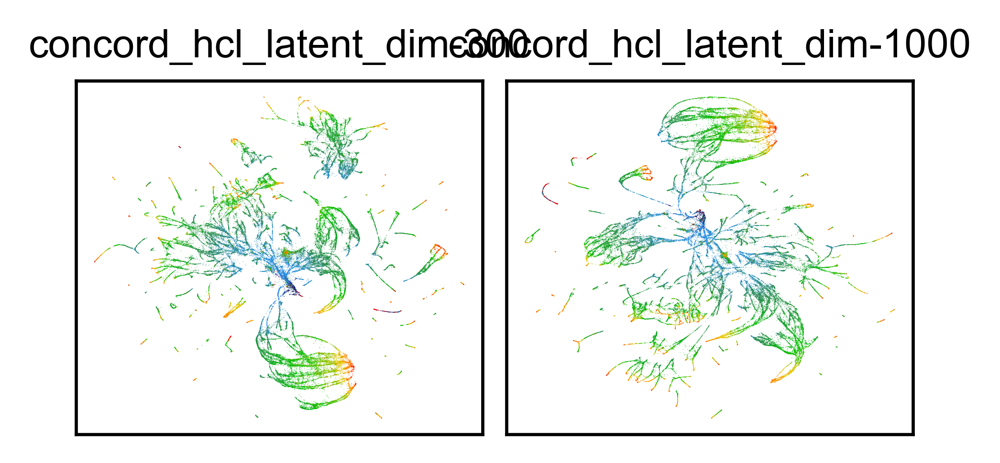

concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-300 with ct_or_lin in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-1000 with ct_or_lin in UMAP


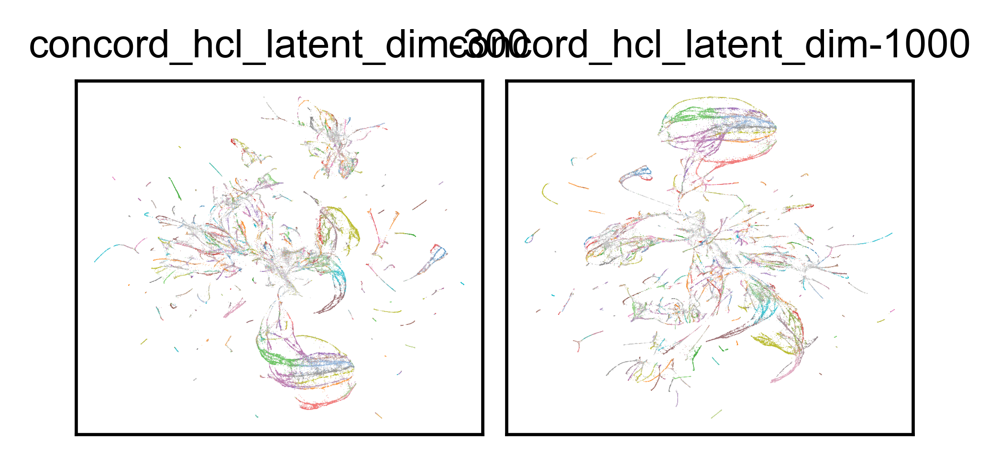

concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-300 with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-1000 with batch in UMAP


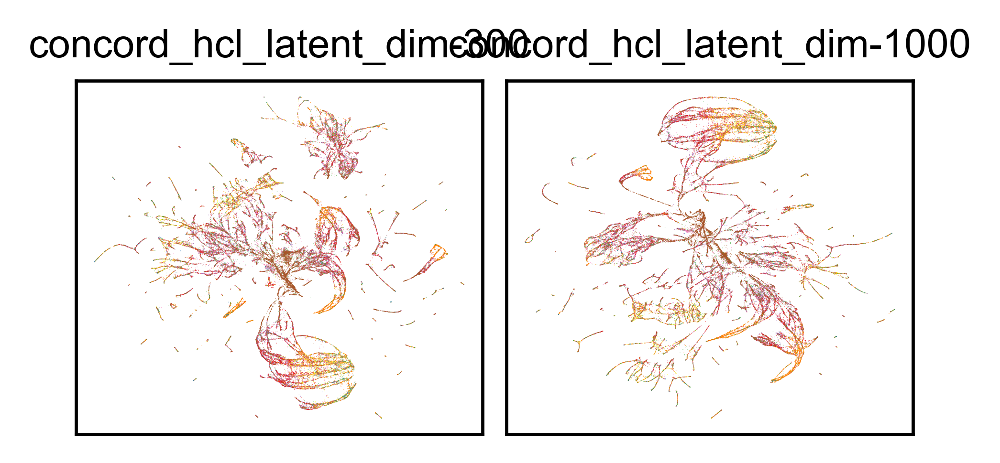

concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-300 with species in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl_latent_dim-1000 with species in UMAP


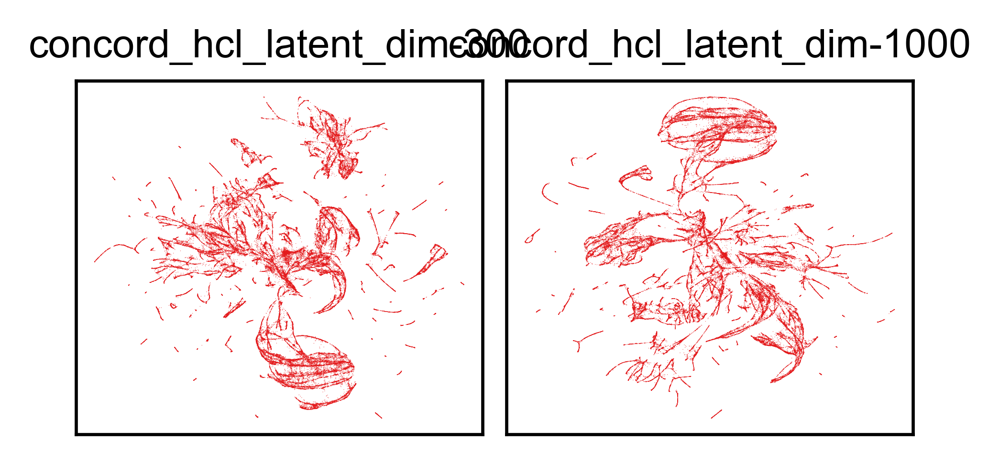

In [20]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

show_keys = output_keys
show_cols = ['embryo.time', 'ct_or_lin', 'batch', 'species']
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))
pal = {'embryo.time': 'BlueGreenRed', 
       "ct_or_lin": 'tab20', 
       'batch': 'Set1', 
       'species': 'Set1'}

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


In [42]:
adata.obs['cell_type'] = adata.obs['cell_type'].astype(str)  # Ensure all values are strings
adata.obs['cell_type'][adata.obs['cell_type'].isin(['', 'nan', 'NaN', 'NA', 'na', 'unannotated'])] = 'NaN'

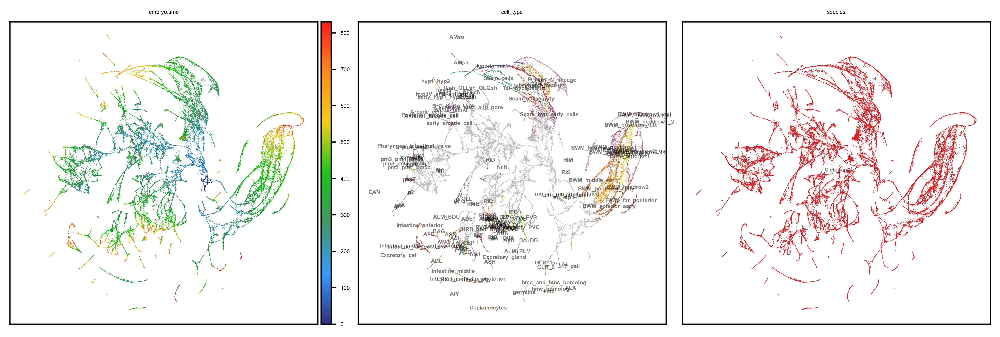

In [44]:
output_key = 'concord_knn'
basis = output_key
show_basis = basis + '_UMAP'
#show_cols = ['cell.type', 'assigned_cell_type', 'round.1.cell.type', 'cell.class', 'tissue.type', 'br.broad.cell.type']
show_cols = ['embryo.time', 'cell_type', 'species']
with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_embedding(
        adata, show_basis, show_cols, figsize=(10,3.3), dpi=600, ncols=3, font_size=4, point_size=0.5, legend_loc='on data',
        pal = pal, seed=seed,
        save_path=save_dir / f"{show_basis}_{file_suffix}_wttext.pdf"
    )

In [24]:
ccd.ul.anndata_to_viscello(adata, data_dir / f"cello_{proj_name}_{file_suffix}", project_name = proj_name, organism='cel')
print(f"Saved viscello to {data_dir / f'cello_{proj_name}_{file_suffix}'}")

VisCello project created at ../data/cel_packerN2/cello_cel_packerN2_Jun28-1251
Saved viscello to ../data/cel_packerN2/cello_cel_packerN2_Jun28-1251


### Benchmarking

✅ Benchmark summary saved to: ../save/cel_packerN2/benchmark_summary_Jun29-1317.tsv


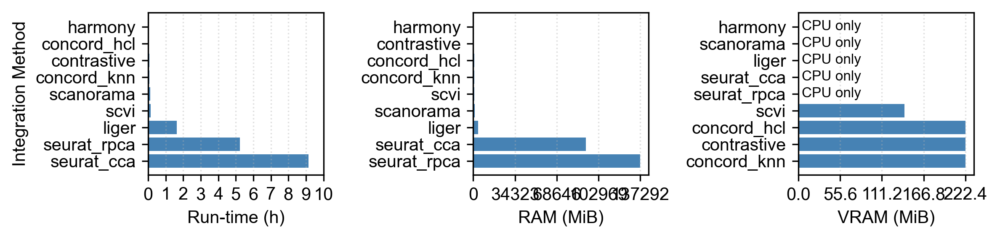

In [16]:
from benchmark_utils import collect_benchmark_logs
bench_df = collect_benchmark_logs("cel_packerN2", methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


In [ ]:
# Check number of non nan values in 'cell_type' column

print(f"Number of cells with bad annotations in 'cell_type': {bad_cells.sum()}")
bad_lineages = adata.obs['lineage_complete'].isin(bad_annotation)
if bad_lineages.sum() > 0:
    print(f"Number of cells with bad annotations in 'lineage_complete': {bad_lineages.sum()}")

Number of cells with bad annotations in 'cell_type': 50590
Number of cells with bad annotations in 'lineage_complete': 58640


#### Benchmark cell type

In [21]:
methods = output_keys

In [22]:
bad_annotation = [np.nan, '', 'unknown', 'None', 'nan', 'NaN', 'NA', 'na', 'unannotated']
bad_cells = adata.obs['cell_type'].isin(bad_annotation) 
adata_ct = adata[~bad_cells].copy()
print(f"✅ Filtered adata to remove bad annotations, new shape: {adata_ct.shape}")

✅ Filtered adata to remove bad annotations, new shape: (43686, 10000)


Embeddings:   0%|          | 0/8 [00:00<?, ?it/s]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  12%|█▎        | 1/8 [08:40<1:00:41, 520.19s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  25%|██▌       | 2/8 [16:37<49:31, 495.22s/it]  

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  38%|███▊      | 3/8 [24:14<39:48, 477.60s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  50%|█████     | 4/8 [31:59<31:30, 472.65s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  62%|██████▎   | 5/8 [39:39<23:23, 467.89s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  75%|███████▌  | 6/8 [47:02<15:19, 459.62s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings:  88%|████████▊ | 7/8 [54:40<07:39, 459.04s/it]

INFO     Arcade_cell consists of a single batch or is too small. Skip.                                             


Embeddings: 100%|██████████| 8/8 [1:02:16<00:00, 467.09s/it]


Detected task: classification
Detected task: classification
[KNN] detected task: classification
[KNN] detected task: classification


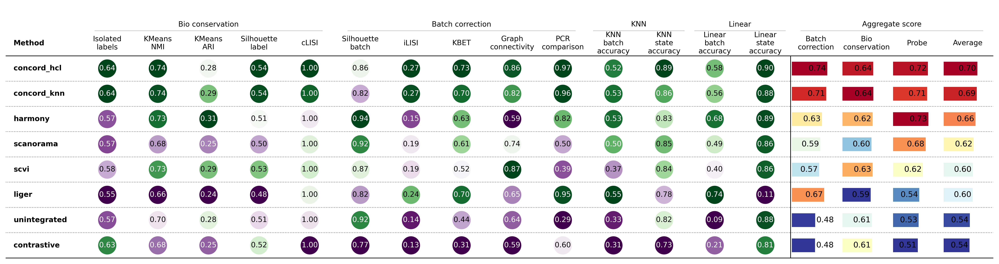

Bio conservation                                         \
              Isolated labels KMeans NMI KMeans ARI Silhouette label   
concord_hcl          0.636124   0.738012   0.275822          0.54242   
concord_knn          0.635885   0.735987   0.293556         0.541151   
harmony              0.567344   0.731592   0.311813         0.513416   
scanorama            0.565774   0.684216   0.254931         0.501456   
scvi                 0.580122   0.725966   0.293909         0.527649   
liger                0.554359   0.662973   0.237275         0.483936   
unintegrated         0.566649    0.69619   0.280296         0.507754   
contrastive           0.62539   0.677807   0.250485         0.519957   

                       Batch correction                      \
                 cLISI Silhouette batch     iLISI      KBET   
concord_hcl   0.999734         0.860356  0.268411  0.731307   
concord_knn   0.999504         0.823154  0.265065  0.698984   
harmony       0.997615         0.938317  0.152223  0.632844   
scanorama       0.9981         0.916247  0.194559  0.611794   
scvi          0.998242         0.867455   0.19022  0.517987   
liger         0.997959         0.817137   0.23833  0.698109   
unintegrated  0.997539         0.917098  0.141218  0.437763   
contrastive   0.995845         0.769936  0.133815  0.312308   

                                                           KNN  \
             Graph connectivity PCR comparison batch\naccuracy   
concord_hcl            0.855673       0.968802        0.522087   
concord_knn            0.822572       0.962917        0.527466   
harmony                0.588685       0.815304        0.529755   
scanorama              0.735524       0.496975        0.498512   
scvi                   0.866061       0.391989        0.374685   
liger                  0.653737       0.950515        0.548524   
unintegrated           0.637244        0.28652        0.327077   
contrastive            0.589524       0.596657        0.310597   

                                      Linear                  Aggregate score  \
             state\naccuracy batch\naccuracy state\naccuracy Batch correction   
concord_hcl         0.890364        0.584411        0.900423          0.73691   
concord_knn         0.859922        0.559574        0.883827         0.714538   
harmony             0.833028        0.680554        0.887604         0.625475   
scanorama           0.852369        0.493991        0.861852          0.59102   
scvi                0.843099        0.401396        0.858991         0.566742   
liger               0.780957        0.738697        0.108161         0.671566   
unintegrated        0.824788        0.090535        0.879020         0.483969   
contrastive         0.727283        0.205906        0.808973         0.480448   

                                                   
             Bio conservation     Probe   Average  
concord_hcl          0.638422  0.724321  0.699884  
concord_knn          0.641217  0.707698  0.687818  
harmony              0.624356  0.732735  0.660855  
scanorama            0.600895  0.676681  0.622865  
scvi                 0.625178  0.619543  0.603821  
liger                  0.5873  0.544085  0.600984  
unintegrated         0.609686  0.530355  0.541337  
contrastive          0.613897  0.513190  0.535845

In [ ]:
state_key = 'cell_type'
batch_key = 'batch'
out = ccd.bm.run_benchmark_pipeline(
    adata_ct,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("scib", "probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")

In [ ]:
# Load if needed
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "rb") as f:
    out = pickle.load(f)

concord.benchmarking.benchmark - INFO - Running Probe benchmark
concord.benchmarking.benchmark - INFO - Running linear probe for state with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']


Detected task: classification
concord.benchmarking.benchmark - INFO - Running linear probe for batch with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
Detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for state with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
[KNN] detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for batch with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
[KNN] detected task: classification


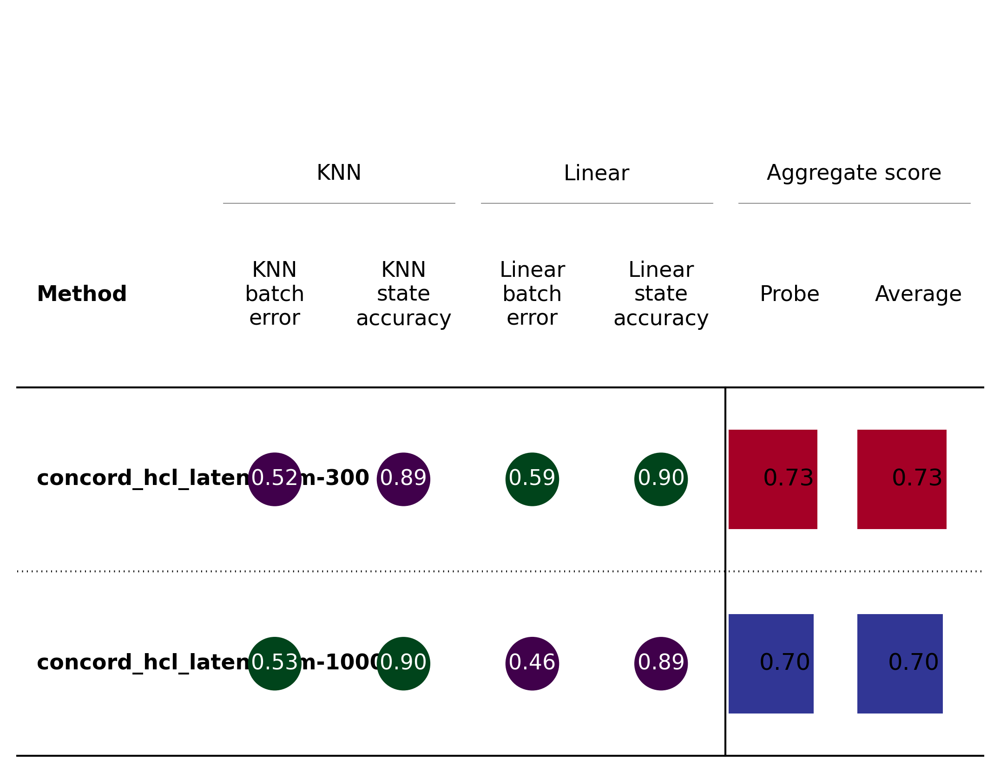

✅ Benchmark results saved to: ../save/cel_packerN2_hyperparam/benchmark_cell_type_Jul02-0208.pkl


In [23]:
# Probe only version
state_key = 'cell_type'
batch_key = 'batch'
out = ccd.bm.run_benchmark_pipeline(
    adata_ct,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_celltype_probe",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_celltype = out["combined"]

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_probe_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")

#### Benchmark lineage

In [24]:
bad_annotation = [np.nan, '', 'unknown', 'None', 'nan', 'NaN', 'NA', 'na', 'unannotated']
bad_cells = adata.obs['lineage_complete'].isin(bad_annotation) 
adata_lineage = adata[~bad_cells].copy()
print(f"✅ Filtered adata to remove bad annotations, new shape: {adata_lineage.shape}")

✅ Filtered adata to remove bad annotations, new shape: (35636, 10000)


Embeddings:   0%|          | 0/8 [00:00<?, ?it/s]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  12%|█▎        | 1/8 [10:12<1:11:27, 612.48s/it]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  25%|██▌       | 2/8 [18:53<55:53, 558.93s/it]  

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  38%|███▊      | 3/8 [2:51:50<6:14:30, 4494.06s/it]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  50%|█████     | 4/8 [3:00:15<3:14:37, 2919.25s/it]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  62%|██████▎   | 5/8 [3:08:55<1:42:41, 2053.90s/it]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  75%|███████▌  | 6/8 [3:17:49<51:14, 1537.22s/it]  

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings:  88%|████████▊ | 7/8 [3:26:45<20:09, 1209.89s/it]

INFO     ABalaax consists of a single batch or is too small. Skip.                                                 
INFO     ABalpax/ABaraax consists of a single batch or is too small. Skip.                                         
INFO     ABarpaa consists of a single batch or is too small. Skip.                                                 
INFO     ABarppxa consists of a single batch or is too small. Skip.                                                
INFO     ABpxapa consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpap consists of a single batch or is too small. Skip.                                                 
INFO     ABpxpp consists of a single batch or is too small. Skip.                                                  
INFO     Cxa consists of a single batch or is too small. Skip.                                                     
INFO     Cxaa consists of a single batch or is too small. Skip.         

Embeddings: 100%|██████████| 8/8 [3:35:40<00:00, 1617.53s/it]


Detected task: classification
Detected task: classification
[KNN] detected task: classification
[KNN] detected task: classification


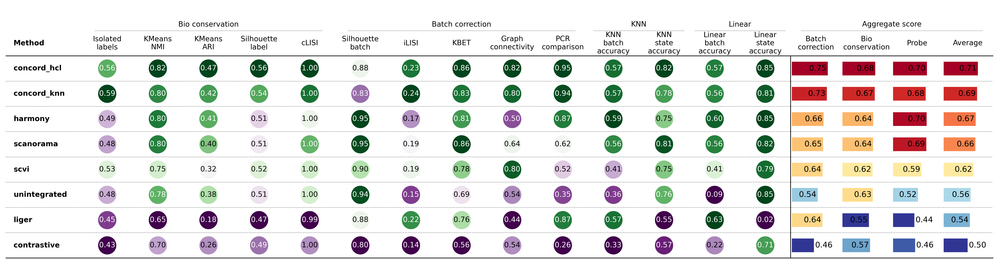

✅ Benchmark results saved to: ../save/cel_packerN2/benchmark_lineage_complete_Jun28-1251.pkl


In [50]:
state_key = 'lineage_complete'
batch_key = 'batch'
out = ccd.bm.run_benchmark_pipeline(
    adata_lineage,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_lineage",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("scib", "probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_lineage = out["combined"]
combined_lineage

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_{state_key}_{file_suffix}.pkl'}")


concord.benchmarking.benchmark - INFO - Running Probe benchmark
concord.benchmarking.benchmark - INFO - Running linear probe for state with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']


Detected task: classification
concord.benchmarking.benchmark - INFO - Running linear probe for batch with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
Detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for state with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
[KNN] detected task: classification
concord.benchmarking.benchmark - INFO - Running k-NN probe for batch with keys ['concord_hcl_latent_dim-300', 'concord_hcl_latent_dim-1000']
[KNN] detected task: classification


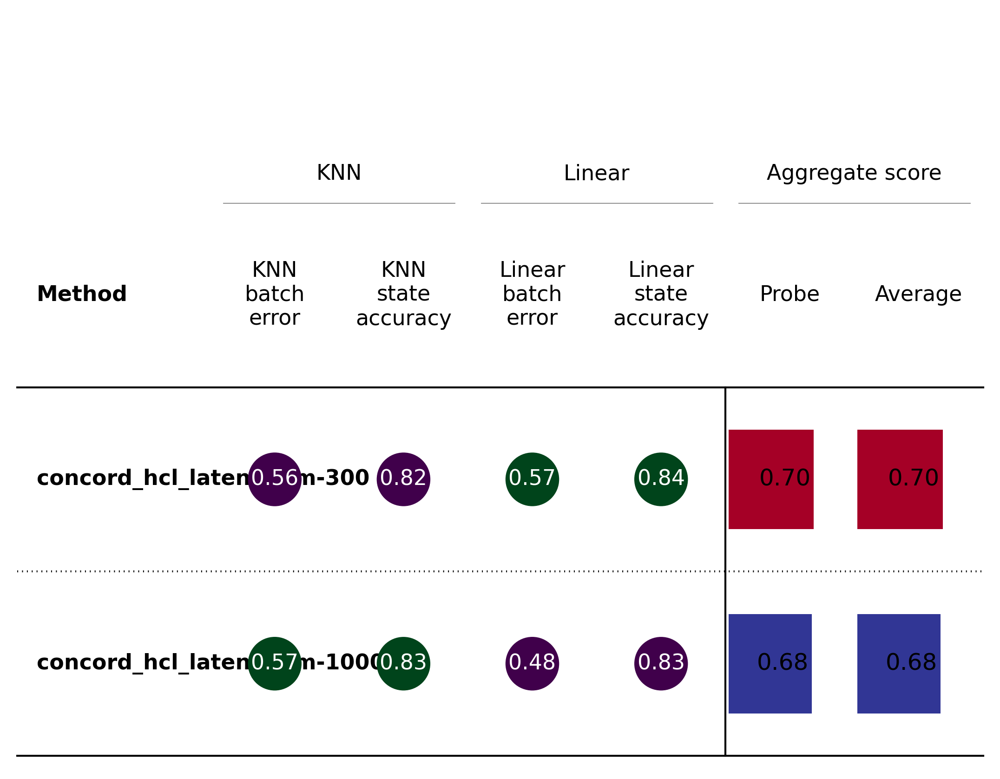

✅ Benchmark results saved to: ../save/cel_packerN2_hyperparam/benchmark_probe_lineage_complete_Jul02-0208.pkl


In [25]:
# Probe only version
state_key = 'lineage_complete'
batch_key = 'batch'
out = ccd.bm.run_benchmark_pipeline(
    adata_lineage,
    embedding_keys=methods,
    state_key=state_key,
    batch_key=batch_key,
    save_dir=save_dir / "benchmarks_lineage_probe",
    file_suffix=file_suffix,  # e.g. "2025-06-25"
    run=("probe"),          # run only these blocks
    plot_individual=False,          # skip the intermediate PDFs
)
combined_lineage = out["combined"]
combined_lineage

# Save the benchmark results
import pickle
with open(save_dir / f"benchmark_probe_{state_key}_{file_suffix}.pkl", "wb") as f:
    pickle.dump(out, f)

print(f"✅ Benchmark results saved to: {save_dir / f'benchmark_probe_{state_key}_{file_suffix}.pkl'}")
